2025-12-17
1- I lost almost all files except the Jupyter notebook while sending to Github.
2- Even before that I had started a new Jupyter notebook to use a new dataset for each of chip, transwell (tw), and chip_tw that is unique all along the notebook, not having 3 versions (samples at columns, samples at rows and a label per condition, and samples at rows and a label for each cell line).
3- One reason for that was standardization for the publication and when I put it on Github later for others to be able to reproduce.
4- I was also warnd by ChatGPT and Gemini that: a- probably have pareto scaled along samples rather than metabolites at some codes; b- I should not pareto scale FCs at x axis of volcano plots so to have real biological FCs.
4- I had already in 20251209 changes removed outliers in chip Astro and Endo KD 12h rep3, because it seems it fails on PCA very different loxation than other replications. And I had already changed the names Brain for chip to Astro since Ruhollah said that was just misslabeling. 
5- New files are chip_data, tw_data, and tw_chip_data

In [20]:
#2025-12-17 Heat map from chip_data.csv

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Global settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Drop metadata columns
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metabolite_df = df.drop(columns=metadata_cols)

# Ensure numeric
metabolite_df = metabolite_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing: log + Pareto (same as before)
# --------------------------------------------------
log_df = np.log1p(metabolite_df)
pareto_scaled_df = log_df / np.sqrt(log_df.std(axis=0))

# --------------------------------------------------
# Heatmap (cluster metabolites)
# --------------------------------------------------
heatmap_data = pareto_scaled_df.T  # metabolites as rows

g = sns.clustermap(
    heatmap_data,
    cmap='viridis',
    metric='euclidean',
    method='average',
    figsize=(20, 30)
)

# Colorbar positioning
g.cax.set_position([1, 0.3, 0.03, 0.25])

# Title and formatting
g.fig.suptitle(
    'Hierarchical Clustering of Metabolites for Chip Experiment',
    fontsize=36,
    fontweight='bold',
    y=1.02
)

g.ax_heatmap.set_yticklabels(
    g.ax_heatmap.get_yticklabels(),
    fontsize=12,
    fontweight='bold'
)

g.ax_heatmap.set_xticklabels(
    g.ax_heatmap.get_xticklabels(),
    fontsize=10,
    rotation=90
)

plt.show()


In [21]:
#2025-12-17 Heat map for tw_data.csv

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Global settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Drop metadata columns
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metabolite_df = df.drop(columns=metadata_cols)

# Ensure numeric
metabolite_df = metabolite_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing: log + Pareto (same as before)
# --------------------------------------------------
log_df = np.log1p(metabolite_df)
pareto_scaled_df = log_df / np.sqrt(log_df.std(axis=0))

# --------------------------------------------------
# Heatmap (cluster metabolites)
# --------------------------------------------------
heatmap_data = pareto_scaled_df.T  # metabolites as rows

g = sns.clustermap(
    heatmap_data,
    cmap='viridis',
    metric='euclidean',
    method='average',
    figsize=(20, 30)
)

# Colorbar positioning
g.cax.set_position([1, 0.3, 0.03, 0.25])

# Title and formatting
g.fig.suptitle(
    'Hierarchical Clustering of Metabolites for Transwell Experiment',
    fontsize=36,
    fontweight='bold',
    y=1.02
)

g.ax_heatmap.set_yticklabels(
    g.ax_heatmap.get_yticklabels(),
    fontsize=12,
    fontweight='bold'
)

g.ax_heatmap.set_xticklabels(
    g.ax_heatmap.get_xticklabels(),
    fontsize=10,
    rotation=90
)

plt.show()


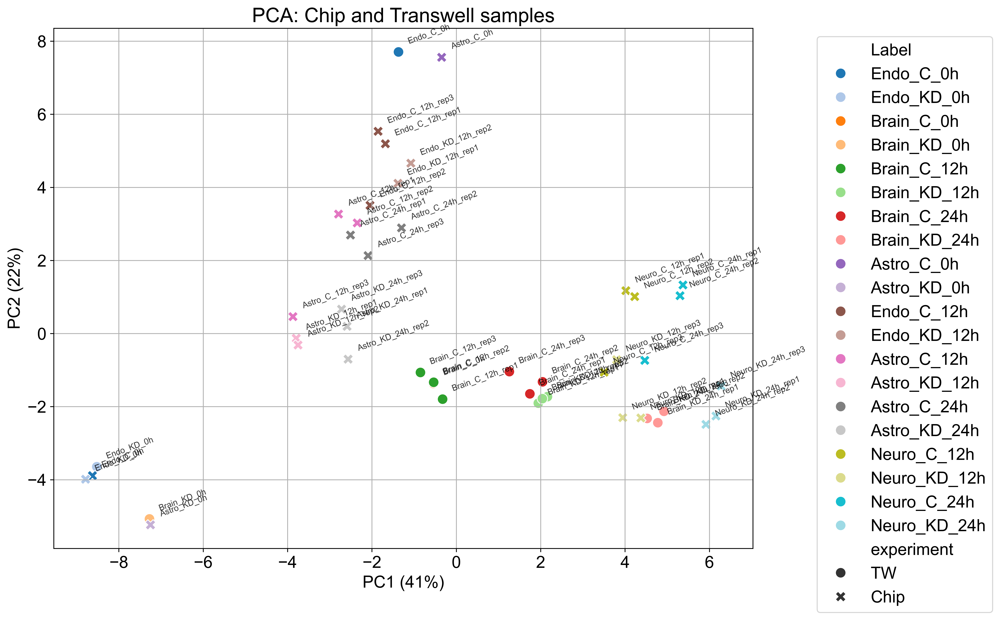

In [8]:
#PCA of all datapoints with annotations, 2025-12-09
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Set global font size, family, and DPI
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# Load data
df = pd.read_csv('chip_TW_PCA_20251209_removing_only_2outliers.csv')

# Use Sample column and first data column for annotations
sample_ids = df['Sample']
annotations = df.iloc[:, 0]  # Now correctly using column 1 (right after 'Sample')

# Only numeric features
features_df = df.select_dtypes(include=[np.number]).dropna()

# Align metadata
valid_idx = features_df.index
labels = df.loc[valid_idx, 'Label']
shapes = df.loc[valid_idx, 'experiment']
annotations = annotations.loc[valid_idx]
sample_ids = sample_ids.loc[valid_idx]

# PCA
log_feat = np.log1p(features_df)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std())
pca = PCA(n_components=2)
principal_components = pca.fit_transform(pareto_scaled_feat)

# Results DataFrame
pca_df = pd.DataFrame(principal_components, columns=['PC1', 'PC2'])
pca_df['Label'] = labels.values
pca_df['experiment'] = shapes.values
pca_df['Annotation'] = annotations.values
pca_df['Sample'] = sample_ids.values

# Plot
plt.figure(figsize=(12, 9))
scatter = sns.scatterplot(x='PC1', y='PC2', hue='Label', style='experiment', data=pca_df, s=100, palette='tab20')

#adjusting the annotations
for i in range(len(pca_df)):
    plt.annotate(str(pca_df.loc[i, 'Annotation']),
                 (pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2']),
                 textcoords="offset points",
                 xytext=(8, 8),  # (x_offset, y_offset) in points
                 ha='left', fontsize=8, alpha=0.8, rotation=20)


plt.legend(title=None)
scatter.legend_.set_bbox_to_anchor((1.08, 1))
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA: Chip and Transwell samples')
plt.grid(True)
plt.show()

In [ ]:
# PCA for Chip vs TW metabolomics including 2 outliers (not to use, keep just in case)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_chip_data.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metadata = df[metadata_cols]

features_df = df.drop(columns=metadata_cols)

# Ensure numeric
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (same logic as MetaboAnalyst)
# --------------------------------------------------
# Log transform
log_feat = np.log1p(features_df)

# Pareto scaling per metabolite (column-wise)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(pareto_scaled_feat)

pca_df = pd.DataFrame(
    pcs,
    columns=['PC1', 'PC2'],
    index=features_df.index
)

# Attach metadata back
pca_df = pd.concat([pca_df, metadata], axis=1)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(13, 10))

scatter = sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Condition',
    style='Platform',
    s=120,
    palette={'C': '#56B4E9', 'KD': '#E69F00'}
)

# Annotate replicates lightly (optional but useful)
for sample, row in pca_df.iterrows():
    plt.annotate(
        f"{row['CellType']}_R{row['Replicate']}",
        (row['PC1'], row['PC2']),
        textcoords='offset points',
        xytext=(6, 6),
        fontsize=8,
        alpha=0.7
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA of Chip vs Transwell Metabolomics- with ouliers')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()


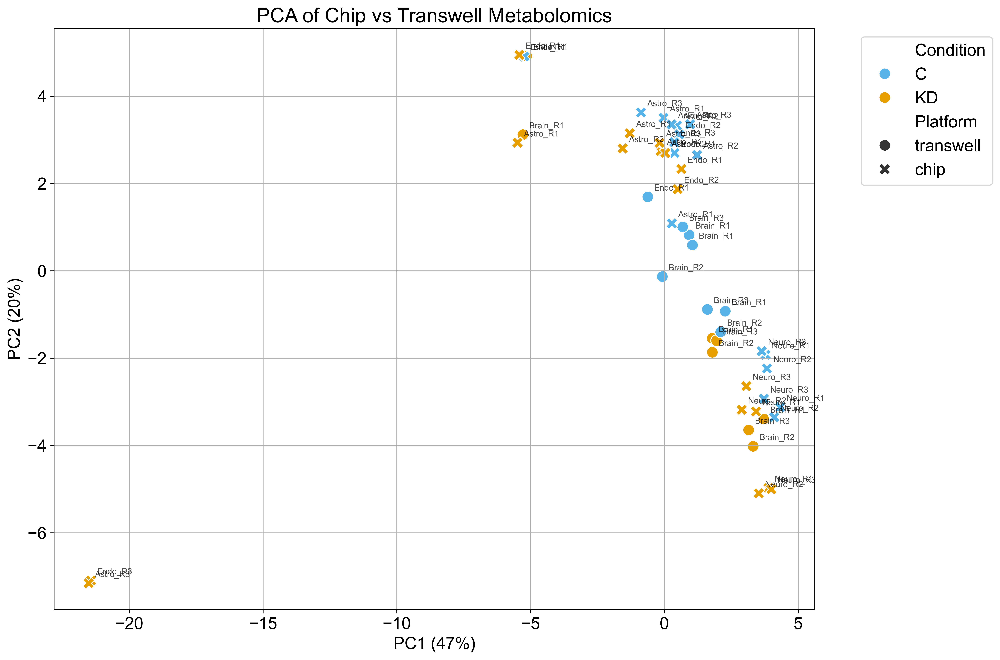

In [14]:
#tw_chip_data_w_outliers
# PCA for Chip vs TW metabolomics (tidy data, reproducible)
# rows = samples, columns = metabolites, explicit metadata

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_chip_data_w_outliers.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metadata = df[metadata_cols]

features_df = df.drop(columns=metadata_cols)

# Ensure numeric
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (same logic as MetaboAnalyst)
# --------------------------------------------------
# Log transform
log_feat = np.log1p(features_df)

# Pareto scaling per metabolite (column-wise)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(pareto_scaled_feat)

pca_df = pd.DataFrame(
    pcs,
    columns=['PC1', 'PC2'],
    index=features_df.index
)

# Attach metadata back
pca_df = pd.concat([pca_df, metadata], axis=1)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(13, 10))

scatter = sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Condition',
    style='Platform',
    s=120,
    palette={'C': '#56B4E9', 'KD': '#E69F00'}
)

# Annotate replicates lightly (optional but useful)
for sample, row in pca_df.iterrows():
    plt.annotate(
        f"{row['CellType']}_R{row['Replicate']}",
        (row['PC1'], row['PC2']),
        textcoords='offset points',
        xytext=(6, 6),
        fontsize=8,
        alpha=0.7
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA of Chip vs Transwell Metabolomics')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()



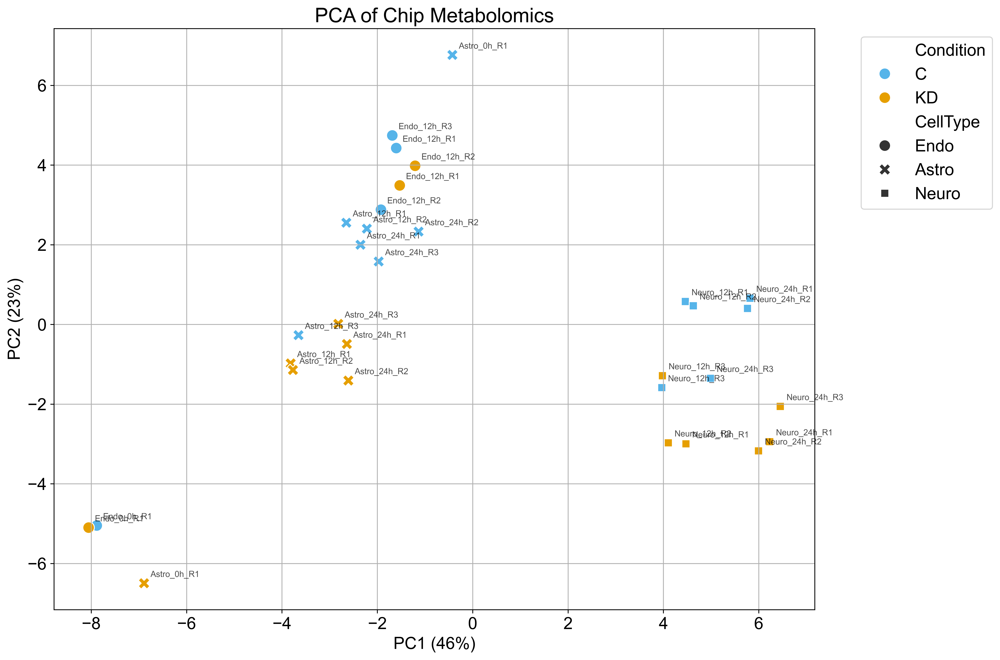

In [ ]:
#PCA for chip 20251217

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metadata = df[metadata_cols]

features_df = df.drop(columns=metadata_cols)

# Ensure numeric
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (same logic as MetaboAnalyst)
# --------------------------------------------------
# Log transform
log_feat = np.log1p(features_df)

# Pareto scaling per metabolite (column-wise)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(pareto_scaled_feat)

pca_df = pd.DataFrame(
    pcs,
    columns=['PC1', 'PC2'],
    index=features_df.index
)

# Attach metadata back
pca_df = pd.concat([pca_df, metadata], axis=1)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(13, 10))

sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Condition',
    style= 'CellType',
    s=120,
    palette={'C': '#56B4E9', 'KD': '#E69F00'}
)

plt.legend(title='Condition')

# Annotate replicates lightly (optional but useful)
for sample, row in pca_df.iterrows():
    plt.annotate(
        f"{row['CellType']}_{row['Time']}_R{row['Replicate']}",
        (row['PC1'], row['PC2']),
        textcoords='offset points',
        xytext=(6, 6),
        fontsize=8,
        alpha=0.7
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA of Chip Metabolomics')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

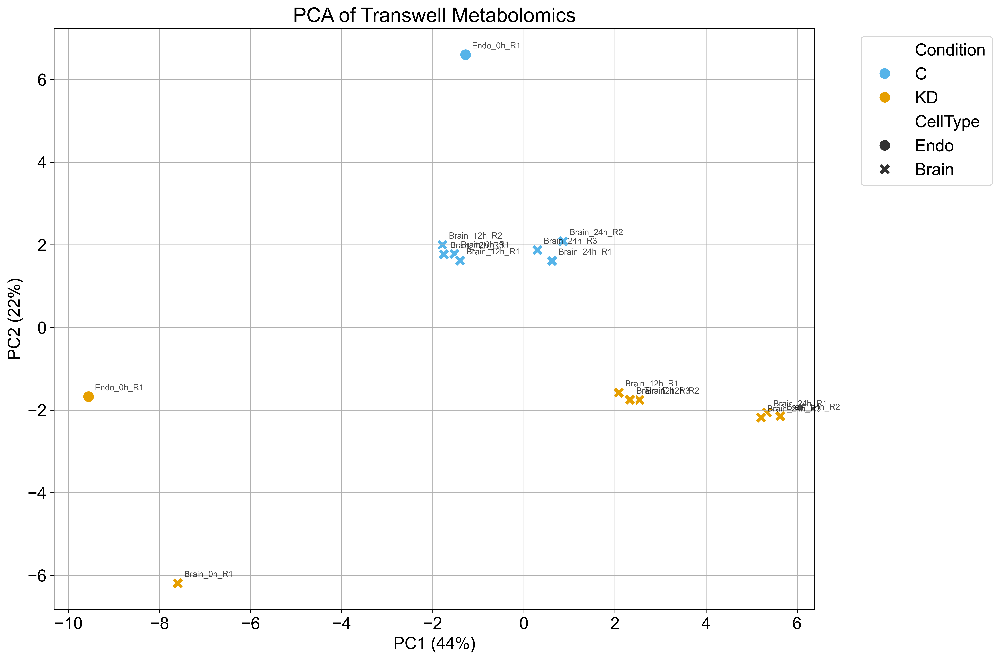

In [9]:
#PCA for tw 20251217

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')

# Set sample ID as index
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
metadata = df[metadata_cols]

features_df = df.drop(columns=metadata_cols)

# Ensure numeric
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (same logic as MetaboAnalyst)
# --------------------------------------------------
# Log transform
log_feat = np.log1p(features_df)

# Pareto scaling per metabolite (column-wise)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pcs = pca.fit_transform(pareto_scaled_feat)

pca_df = pd.DataFrame(
    pcs,
    columns=['PC1', 'PC2'],
    index=features_df.index
)

# Attach metadata back
pca_df = pd.concat([pca_df, metadata], axis=1)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(13, 10))

sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='Condition',
    style= 'CellType',
    s=120,
    palette={'C': '#56B4E9', 'KD': '#E69F00'}
)

plt.legend(title='Condition')

# Annotate replicates lightly (optional but useful)
for sample, row in pca_df.iterrows():
    plt.annotate(
        f"{row['CellType']}_{row['Time']}_R{row['Replicate']}",
        (row['PC1'], row['PC2']),
        textcoords='offset points',
        xytext=(6, 6),
        fontsize=8,
        alpha=0.7
    )

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA of Transwell Metabolomics')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()



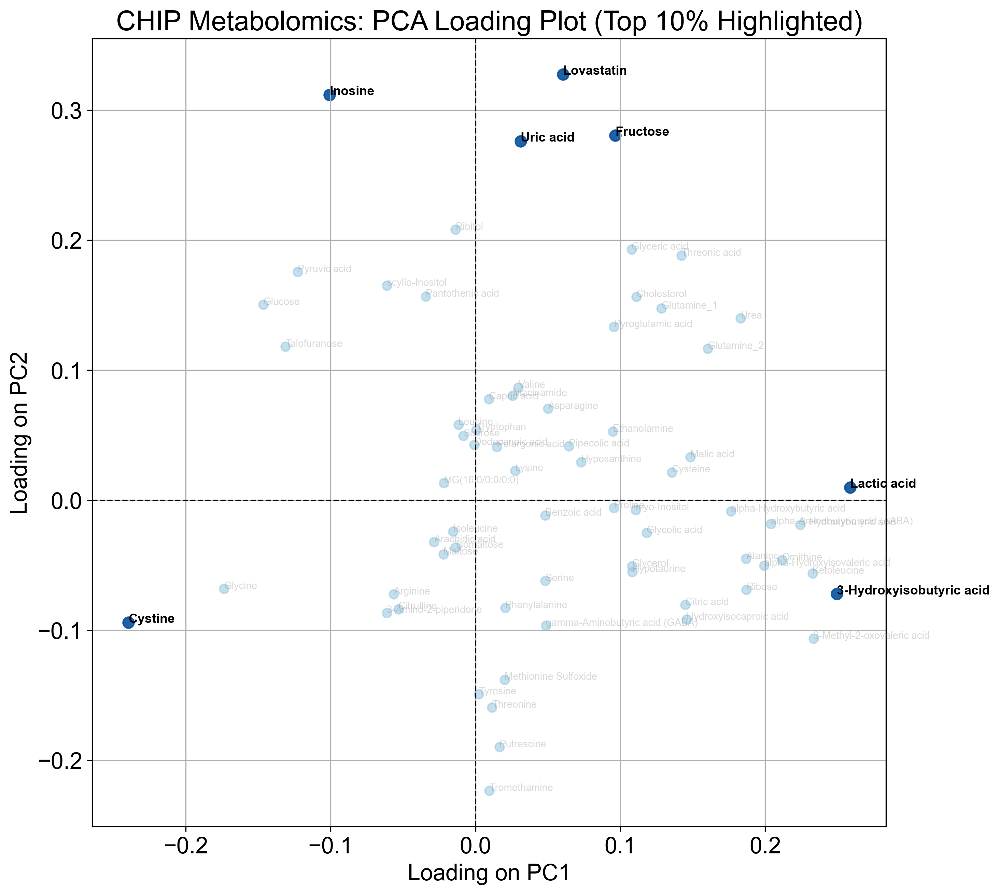

In [49]:
# Loading plot for CHIP metabolomics
# 2025-12-17

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
features_df = df.drop(columns=metadata_cols)
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (log + Pareto)
# --------------------------------------------------
log_feat = np.log1p(features_df)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pca.fit(pareto_scaled_feat)

# --------------------------------------------------
# Loadings
# --------------------------------------------------
loading_df = pd.DataFrame(
    pca.components_.T,
    index=features_df.columns,
    columns=['PC1', 'PC2']
)

loading_df['magnitude'] = np.sqrt(
    loading_df['PC1']**2 + loading_df['PC2']**2
)

cutoff = loading_df['magnitude'].quantile(0.90)

top_mask = loading_df['magnitude'] >= cutoff
top_df = loading_df[top_mask]
rest_df = loading_df[~top_mask]

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 10))

# 90% metabolites (light blue)
plt.scatter(
    rest_df['PC1'],
    rest_df['PC2'],
    color='#9ecae1',   # light blue
    alpha=0.6,
    s=40
)

# Top 10% metabolites (dark blue)
plt.scatter(
    top_df['PC1'],
    top_df['PC2'],
    color='#08519c',   # dark blue
    alpha=0.9,
    s=60
)

# Annotate metabolites (single pass, conditional styling)
for metabolite, row in loading_df.iterrows():
    is_top = row['magnitude'] >= cutoff

    plt.text(
        row['PC1'],
        row['PC2'],
        metabolite,
        fontsize=9 if is_top else 7,
        fontweight='bold' if is_top else 'normal',
        color='black' if is_top else 'gray',
        alpha=1.0 if is_top else 0.3
    )

plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.axvline(0, color='black', linestyle='--', linewidth=1)

plt.xlabel('Loading on PC1')
plt.ylabel('Loading on PC2')
plt.title('CHIP Metabolomics: PCA Loading Plot (Top 10% Highlighted)')
plt.grid(True)

plt.show()


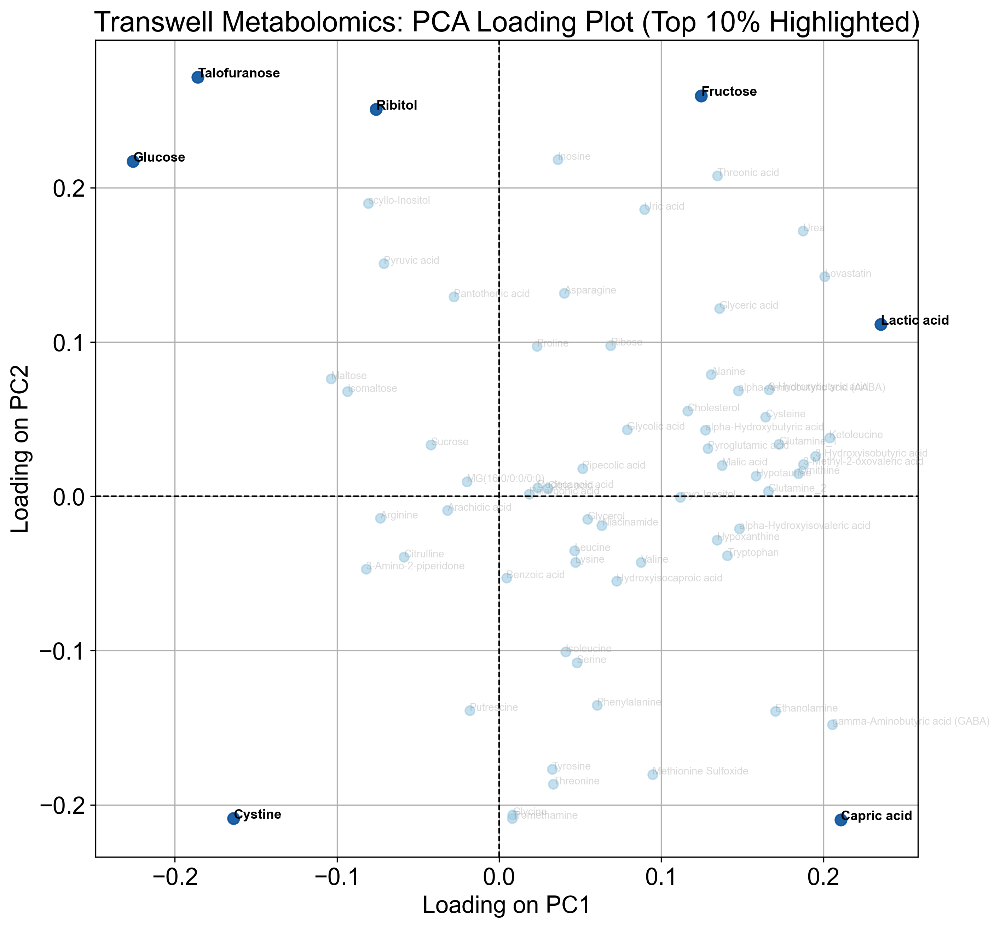

In [ ]:
# Loading plot for tw  metabolomics 2025-12-17

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# --------------------------------------------------
# Global settings
# --------------------------------------------------
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')
df.set_index('Sample', inplace=True)

# --------------------------------------------------
# Separate metadata and metabolite matrix
# --------------------------------------------------
metadata_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
features_df = df.drop(columns=metadata_cols)
features_df = features_df.apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Preprocessing (log + Pareto)
# --------------------------------------------------
log_feat = np.log1p(features_df)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std(axis=0))

# --------------------------------------------------
# PCA
# --------------------------------------------------
pca = PCA(n_components=2)
pca.fit(pareto_scaled_feat)

# --------------------------------------------------
# Loadings
# --------------------------------------------------
loading_df = pd.DataFrame(
    pca.components_.T,
    index=features_df.columns,
    columns=['PC1', 'PC2']
)

loading_df['magnitude'] = np.sqrt(
    loading_df['PC1']**2 + loading_df['PC2']**2
)

cutoff = loading_df['magnitude'].quantile(0.90)

top_mask = loading_df['magnitude'] >= cutoff
top_df = loading_df[top_mask]
rest_df = loading_df[~top_mask]

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 10))

# 90% metabolites (light blue)
plt.scatter(
    rest_df['PC1'],
    rest_df['PC2'],
    color='#9ecae1',   # light blue
    alpha=0.6,
    s=40
)

# Top 10% metabolites (dark blue)
plt.scatter(
    top_df['PC1'],
    top_df['PC2'],
    color='#08519c',   # dark blue
    alpha=0.9,
    s=60
)

# Annotate metabolites (single pass, conditional styling)
for metabolite, row in loading_df.iterrows():
    is_top = row['magnitude'] >= cutoff

    plt.text(
        row['PC1'],
        row['PC2'],
        metabolite,
        fontsize=9 if is_top else 7,
        fontweight='bold' if is_top else 'normal',
        color='black' if is_top else 'gray',
        alpha=1.0 if is_top else 0.3
    )

plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.axvline(0, color='black', linestyle='--', linewidth=1)

plt.xlabel('Loading on PC1')
plt.ylabel('Loading on PC2')
plt.title('Transwell Metabolomics: PCA Loading Plot (Top 10% Highlighted)')
plt.grid(True)

plt.show()


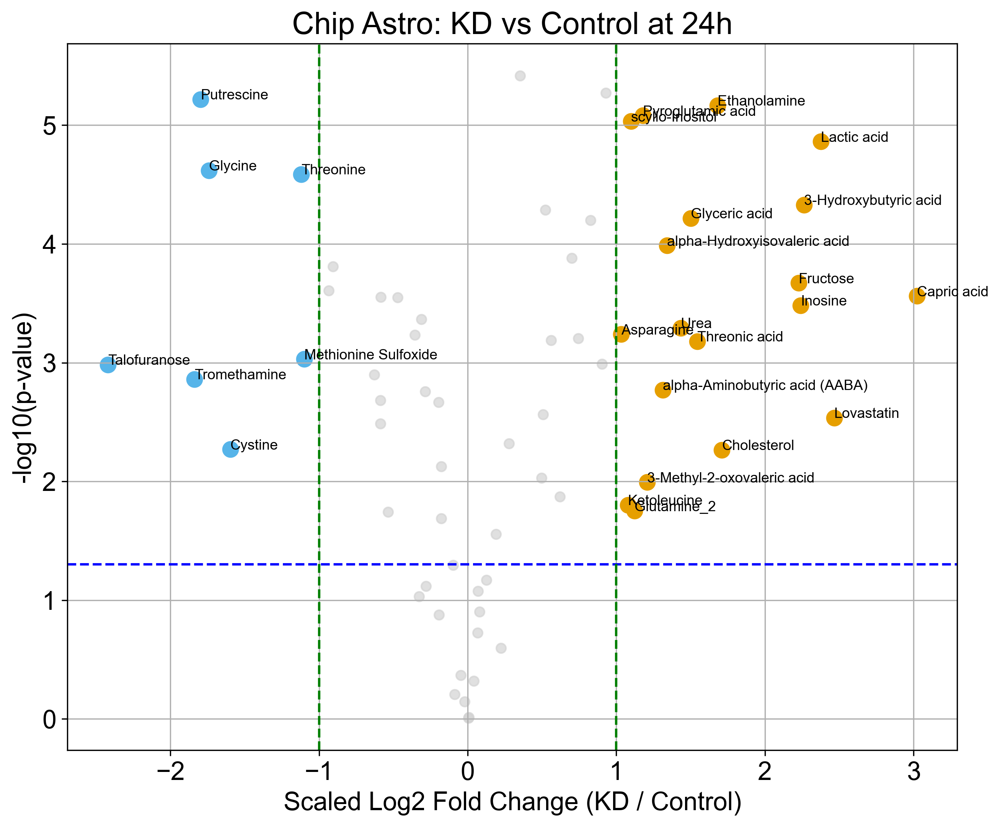

In [20]:
# Volcano plot: CHIP Astro KD vs Control at 24h
# Normalized to Astro 0h (KD to KD, Control to Control)
# X-axis: SCALED Log2 Fold Change (KD / Control) 2025-12-18

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
astro_kd_24h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

astro_c_24h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '24h')
]

astro_kd_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

astro_c_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→C)
# --------------------------------------------------
norm_kd_24 = astro_kd_24h.div(astro_kd_0h.mean())
norm_c_24 = astro_c_24h.div(astro_c_0h.mean())

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_24)
log_c = np.log1p(norm_c_24)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Astro_24h_KDvsC.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Astro: KD vs Control at 24h')
plt.grid(True)

plt.show()


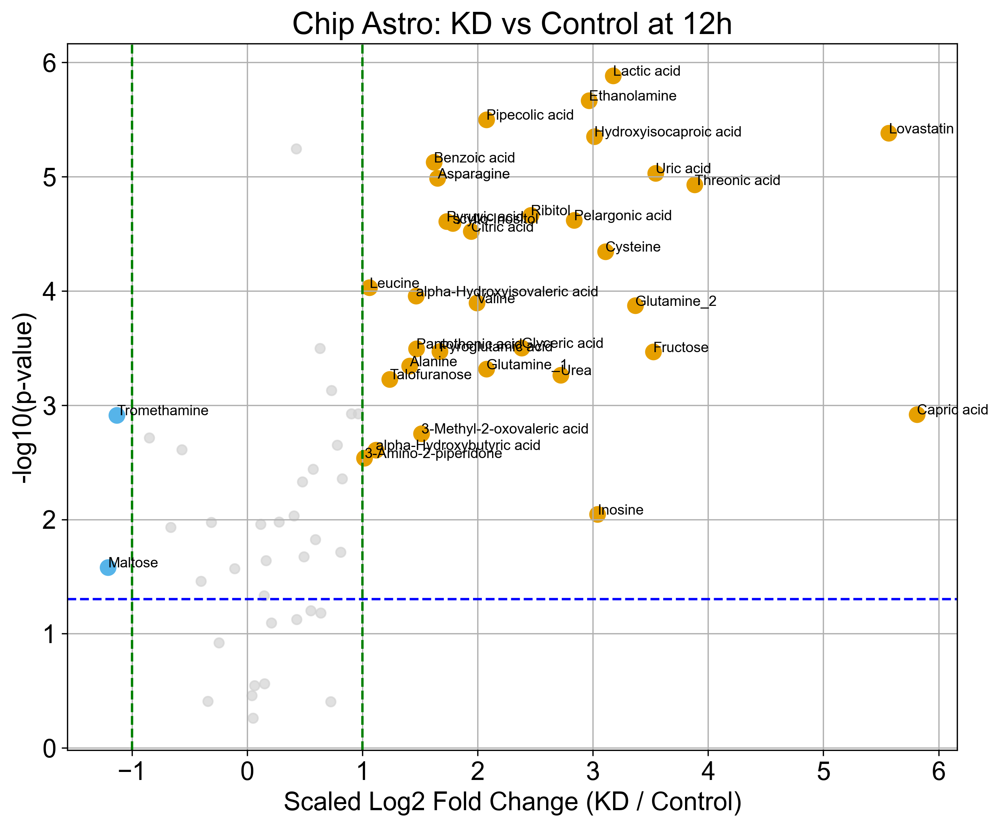

In [21]:
# Volcano plot: CHIP Astro KD vs Control at 12h
# Normalized to Astro 0h (KD to KD, Control to Control)
# X-axis: SCALED Log2 Fold Change (KD / Control)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
astro_kd_12h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

astro_c_12h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '12h')
]

astro_kd_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

astro_c_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→C)
# --------------------------------------------------
norm_kd_12 = astro_kd_12h.div(astro_kd_0h.mean())
norm_c_12 = astro_c_12h.div(astro_c_0h.mean())

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_12)
log_c = np.log1p(norm_c_12)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Astro_KD_vs_Control_12h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Astro: KD vs Control at 12h')
plt.grid(True)

plt.show()


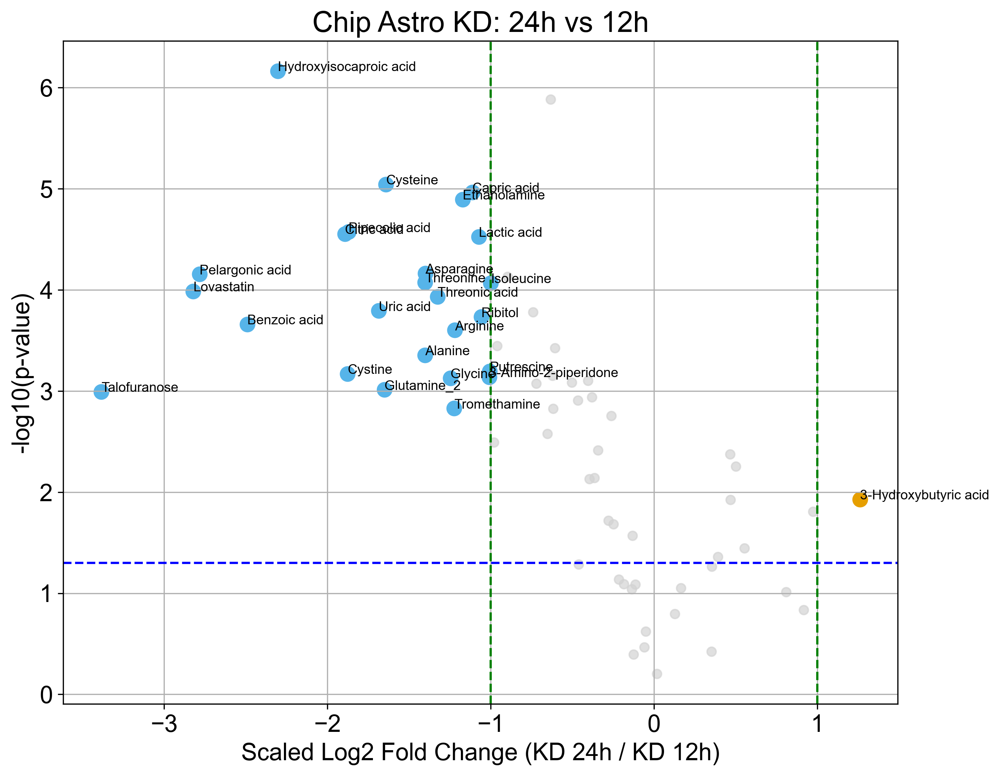

In [22]:
# Volcano plot: Chip Astro KD 24h vs 12h
# Normalized to Astro KD 0h
# X-axis: SCALED Log2 Fold Change (KD 24h / KD 12h)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
astro_kd_12h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

astro_kd_24h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

astro_kd_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD → KD)
# --------------------------------------------------
baseline_mean = astro_kd_0h.mean()

norm_12 = astro_kd_12h.div(baseline_mean)
norm_24 = astro_kd_24h.div(baseline_mean)

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_12 = np.log1p(norm_12)
log_24 = np.log1p(norm_24)

log_12_scaled = log_12.div(np.sqrt(log_12.std()), axis=1)
log_24_scaled = log_24.div(np.sqrt(log_24.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_24_scaled.mean() / log_12_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_24_scaled[col],
        log_12_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_12_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_12_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Astro_KD_24h_vs_12h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD 24h / KD 12h)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Astro KD: 24h vs 12h')
plt.grid(True)

plt.show()


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


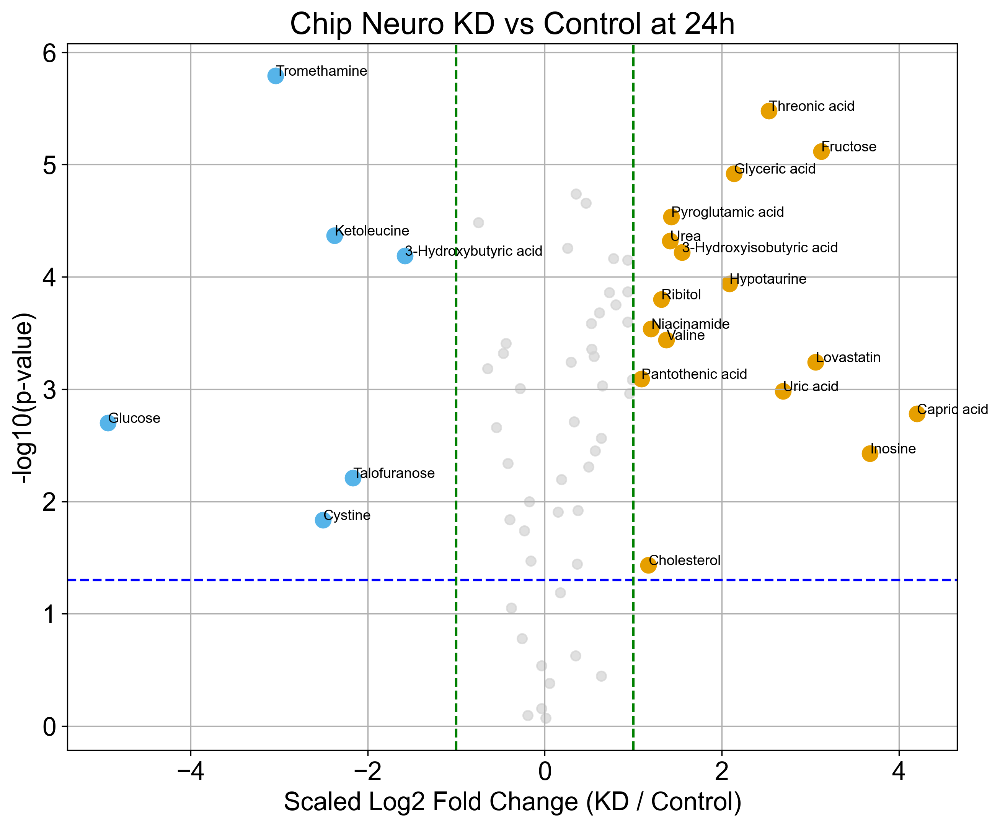

In [23]:
# Volcano plot: Chip Neuro KD vs Control at 24h
# Normalized to Astro 0h (KD to KD, Control to Control)
# X-axis: SCALED Log2 Fold Change (KD / Control)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
neuro_kd_24h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

neuro_c_24h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '24h')
]

astro_kd_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

astro_c_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→C)
# --------------------------------------------------
norm_kd_24 = neuro_kd_24h.div(astro_kd_0h.mean())
norm_c_24 = neuro_c_24h.div(astro_c_0h.mean())

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_24)
log_c = np.log1p(norm_c_24)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Neuro_KD_vs_Control_24h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Neuro KD vs Control at 24h')
plt.grid(True)

plt.show()


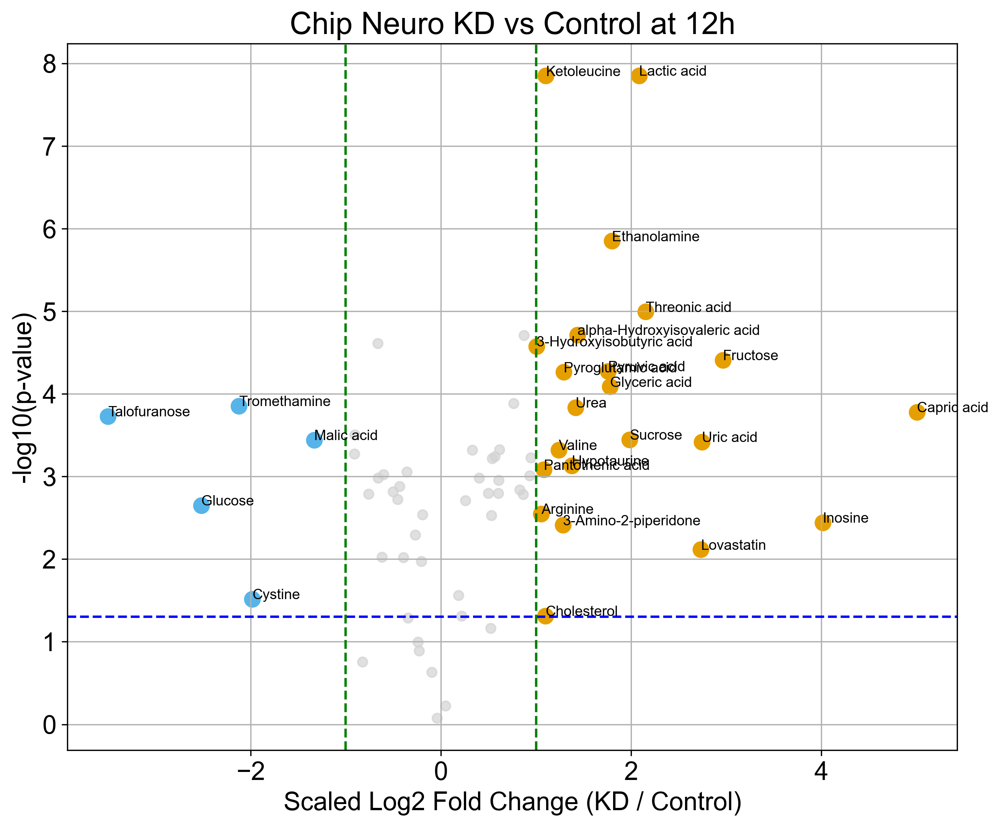

In [24]:
# Volcano plot: Chip Neuro KD vs Control at 12h
# Normalized to Astro 0h (KD to KD, Control to Control)
# X-axis: SCALED Log2 Fold Change (KD / Control)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
neuro_kd_12h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

neuro_c_12h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '12h')
]

astro_kd_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

astro_c_0h = metab[
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→C)
# --------------------------------------------------
norm_kd_12 = neuro_kd_12h.div(astro_kd_0h.mean())
norm_c_12 = neuro_c_12h.div(astro_c_0h.mean())

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_12)
log_c = np.log1p(norm_c_12)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Neuro_KD_vs_Control_12h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Neuro KD vs Control at 12h')
plt.grid(True)

plt.show()


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


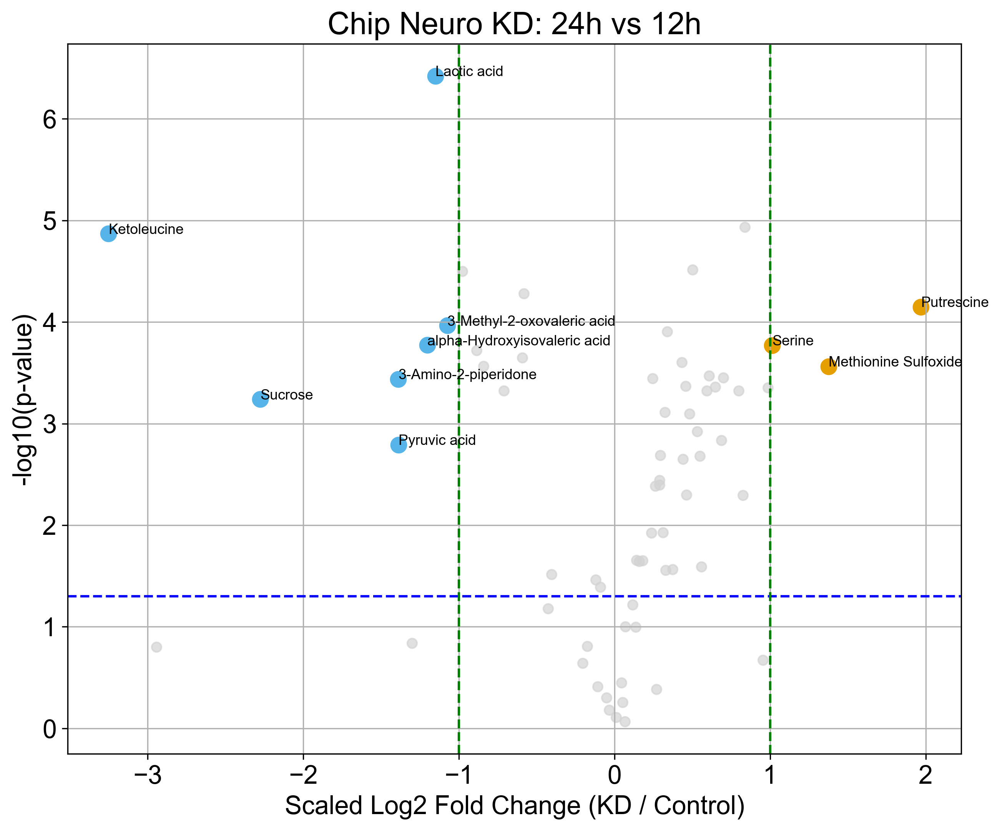

In [ ]:
## Volcano plot: CHIP Neuro KD 24h vs 12h; X-axis: SCALED log2 Fold Change; 2025-12-18

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
neuro_kd_12h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

neuro_kd_24h = metab[
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

baseline_0h = metab[
    (meta['CellType'] == 'Astro') &   # or 'Endo'
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization
# --------------------------------------------------
baseline_mean = baseline_0h.mean()

norm_12 = neuro_kd_12h.div(baseline_mean)
norm_24 = neuro_kd_24h.div(baseline_mean)

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_12 = np.log1p(norm_12)
log_24 = np.log1p(norm_24)

log_12_scaled = log_12.div(np.sqrt(log_12.std()), axis=1)
log_24_scaled = log_24.div(np.sqrt(log_24.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_24_scaled.mean() / log_12_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_24_scaled[col],
        log_12_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_12_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_12_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value']].to_csv(
    'significant_hits_scaledFC_KD_vs_Control.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Neuro KD: 24h vs 12h')
plt.grid(True)

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])
plt.show()
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_chip_Neuro_24vs12.csv',
    index=False
)

c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


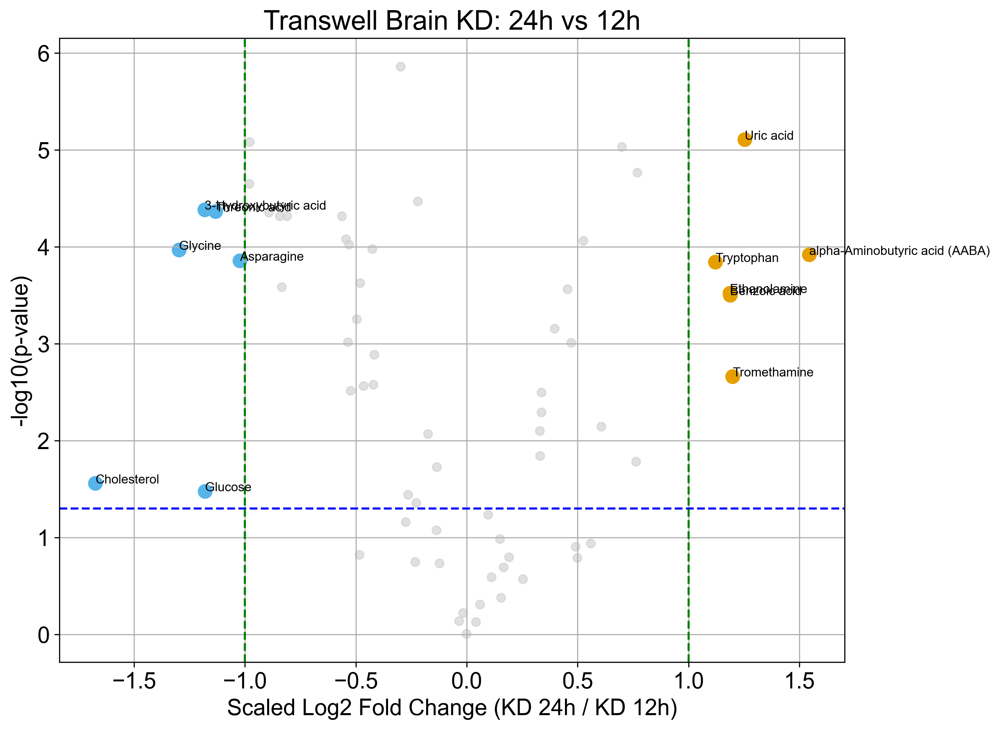

In [27]:
# Volcano plot: Chip Brain KD 24h vs 12h (TW data)
# Normalized to Brain KD 0h
# X-axis: SCALED Log2 Fold Change (KD 24h / KD 12h)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
brain_kd_12h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

brain_kd_24h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

brain_kd_0h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD → KD)
# --------------------------------------------------
baseline_mean = brain_kd_0h.mean()

norm_12 = brain_kd_12h.div(baseline_mean)
norm_24 = brain_kd_24h.div(baseline_mean)

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_12 = np.log1p(norm_12)
log_24 = np.log1p(norm_24)

log_12_scaled = log_12.div(np.sqrt(log_12.std()), axis=1)
log_24_scaled = log_24.div(np.sqrt(log_24.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_24_scaled.mean() / log_12_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_24_scaled[col],
        log_12_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_12_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_12_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_tw_Brain_KD_24h_vs_12h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD 24h / KD 12h)')
plt.ylabel('-log10(p-value)')
plt.title('Transwell Brain KD: 24h vs 12h')
plt.grid(True)

plt.show()


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


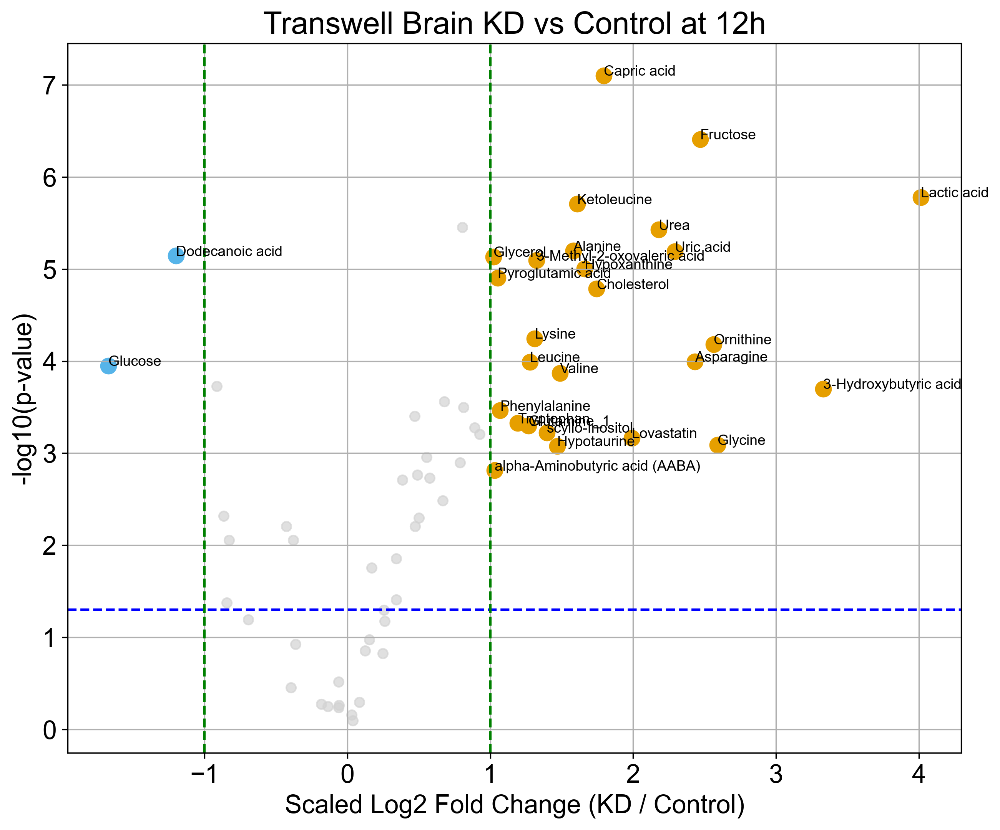

In [28]:
# Volcano plot: Chip Brain KD vs Control at 12h (TW data)
# Normalized to Brain 0h (KD to KD, Control to Control)
# X-axis: SCALED Log2 Fold Change (KD / Control)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
brain_kd_12h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '12h')
]

brain_c_12h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '12h')
]

brain_kd_0h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

brain_c_0h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→C)
# --------------------------------------------------
norm_kd_12 = brain_kd_12h.div(brain_kd_0h.mean())
norm_c_12 = brain_c_12h.div(brain_c_0h.mean())

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_12)
log_c = np.log1p(norm_c_12)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_tw_Brain_KD_vs_Control_12h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Transwell Brain KD vs Control at 12h')
plt.grid(True)

plt.show()


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


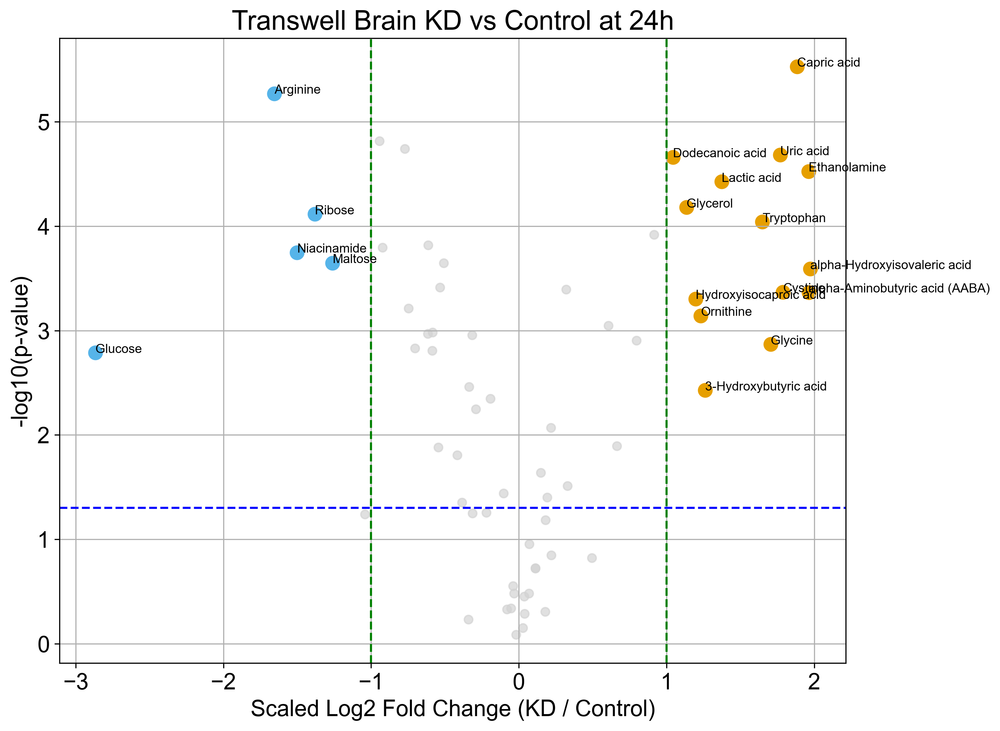

In [30]:
# Volcano plot: Chip Brain KD vs Control at 24h (TW data)
# Both conditions normalized to Brain KD 0h
# X-axis: SCALED Log2 Fold Change (KD / Control)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
metab = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups
# --------------------------------------------------
brain_kd_24h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

brain_c_24h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'C') &
    (meta['Time'] == '24h')
]

brain_kd_0h = metab[
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Baseline normalization (KD→KD, C→KD)
# --------------------------------------------------
baseline_mean = brain_kd_0h.mean()

norm_kd_24 = brain_kd_24h.div(baseline_mean)
norm_c_24 = brain_c_24h.div(baseline_mean)

# --------------------------------------------------
# OLD logic: log1p + Pareto scaling
# --------------------------------------------------
log_kd = np.log1p(norm_kd_24)
log_c = np.log1p(norm_c_24)

log_kd_scaled = log_kd.div(np.sqrt(log_kd.std()), axis=1)
log_c_scaled = log_c.div(np.sqrt(log_c.std()), axis=1)

# --------------------------------------------------
# Scaled log2 fold change
# --------------------------------------------------
log2_fc_scaled = np.log2(
    log_kd_scaled.mean() / log_c_scaled.mean()
)

# --------------------------------------------------
# Statistics
# --------------------------------------------------
p_vals = [
    ttest_ind(
        log_kd_scaled[col],
        log_c_scaled[col],
        equal_var=False
    ).pvalue
    for col in log_kd_scaled.columns
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': log_kd_scaled.columns,
    'scaled_log2FC': log2_fc_scaled,
    'p_value': p_vals
})

volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Identify significant hits
# --------------------------------------------------
hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
].copy()

# --------------------------------------------------
# Save significant hits
# --------------------------------------------------
hits[['Metabolite', 'scaled_log2FC', 'p_value', '-log10(p_value)']].to_csv(
    'significant_hits_tw_Brain_KD_vs_Control_24h_normKD0h.csv',
    index=False
)

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))

plt.scatter(
    volcano_df['scaled_log2FC'],
    volcano_df['-log10(p_value)'],
    color='lightgray',
    alpha=0.7
)

plt.scatter(
    hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
    color='#E69F00',
    s=90
)

plt.scatter(
    hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
    hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
    color='#56B4E9',
    s=90
)

for _, row in hits.iterrows():
    plt.text(
        row['scaled_log2FC'],
        row['-log10(p_value)'],
        row['Metabolite'],
        fontsize=9
    )

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.title('Transwell Brain KD vs Control at 24h')
plt.grid(True)

plt.show()


(3, 69) (3, 69)


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


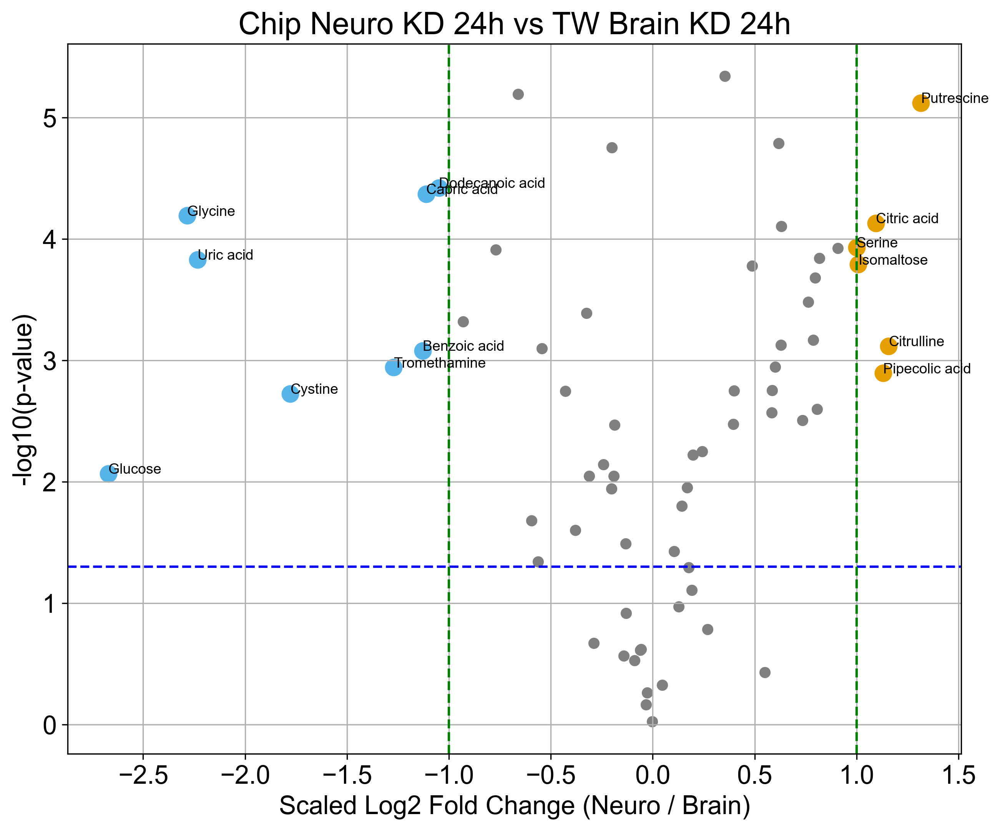

In [35]:
# Volcano plot: Chip Neuro KD 24h vs TW Brain KD 24h
# Neuro normalized to Astro KD 0h (chip)
# Brain normalized to Brain KD 0h (transwell)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# --------------------------------------------------
# Load data
# --------------------------------------------------
df = pd.read_csv('tw_chip_data.csv')
df.set_index('Sample', inplace=True)

meta_cols = ['Platform', 'CellType', 'Condition', 'Time', 'Replicate']
meta = df[meta_cols]
data_numeric = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')

# --------------------------------------------------
# Select groups (USE CORRECT PLATFORM VALUES)
# --------------------------------------------------
brain_kd_24h = data_numeric[
    (meta['Platform'] == 'transwell') &
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

brain_kd_0h = data_numeric[
    (meta['Platform'] == 'transwell') &
    (meta['CellType'] == 'Brain') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

neuro_kd_24h = data_numeric[
    (meta['Platform'] == 'chip') &
    (meta['CellType'] == 'Neuro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '24h')
]

astro_kd_0h = data_numeric[
    (meta['Platform'] == 'chip') &
    (meta['CellType'] == 'Astro') &
    (meta['Condition'] == 'KD') &
    (meta['Time'] == '0h')
]

# --------------------------------------------------
# Sanity check (optional but recommended)
# --------------------------------------------------
print(brain_kd_24h.shape, neuro_kd_24h.shape)

# --------------------------------------------------
# Normalize (EXACTLY like old code)
# --------------------------------------------------
norm_brain = brain_kd_24h.div(brain_kd_0h.mean())
norm_neuro = neuro_kd_24h.div(astro_kd_0h.mean())

# --------------------------------------------------
# Log + Pareto scaling (old working style)
# --------------------------------------------------
log_brain = np.log1p(norm_brain)
log_neuro = np.log1p(norm_neuro)

log_brain = log_brain.div(np.sqrt(np.log1p(norm_brain).std()), axis=1)
log_neuro = log_neuro.div(np.sqrt(np.log1p(norm_neuro).std()), axis=1)

# --------------------------------------------------
# Align metabolites (defensive, but safe)
# --------------------------------------------------
common_mets = log_brain.columns.intersection(log_neuro.columns)
log_brain = log_brain[common_mets]
log_neuro = log_neuro[common_mets]

# --------------------------------------------------
# Fold change and stats
# --------------------------------------------------
log2_fc = np.log2(log_neuro.mean() / log_brain.mean())

p_vals = [
    ttest_ind(log_brain[m], log_neuro[m], equal_var=False).pvalue
    for m in common_mets
]

# --------------------------------------------------
# Volcano table
# --------------------------------------------------
volcano_df = pd.DataFrame({
    'Metabolite': common_mets,
    'scaled_log2FC': log2_fc,
    'p_value': p_vals
})
volcano_df['-log10(p_value)'] = -np.log10(volcano_df['p_value'])

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['scaled_log2FC'],
            volcano_df['-log10(p_value)'],
            color='gray')

hits = volcano_df[
    (volcano_df['p_value'] < 0.05) &
    (np.abs(volcano_df['scaled_log2FC']) > 1)
]

plt.scatter(hits[hits['scaled_log2FC'] > 1]['scaled_log2FC'],
            hits[hits['scaled_log2FC'] > 1]['-log10(p_value)'],
            color='#E69F00', s=100)

plt.scatter(hits[hits['scaled_log2FC'] < -1]['scaled_log2FC'],
            hits[hits['scaled_log2FC'] < -1]['-log10(p_value)'],
            color='#56B4E9', s=100)

for _, row in hits.iterrows():
    plt.text(row['scaled_log2FC'], row['-log10(p_value)'],
             row['Metabolite'], fontsize=9)

plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.xlabel('Scaled Log2 Fold Change (Neuro / Brain)')
plt.ylabel('-log10(p-value)')
plt.title('Chip Neuro KD 24h vs TW Brain KD 24h')
plt.grid(True)
plt.show()


C:\Users\Omid\AppData\Local\Temp\ipykernel_22000\4227411105.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


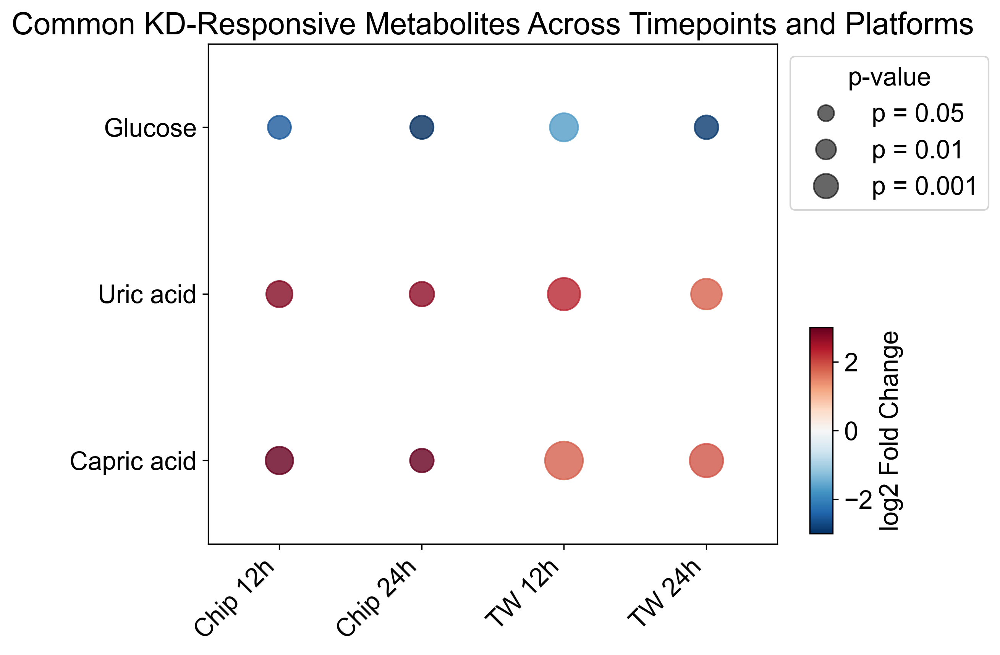

In [ ]:
#"Common KD-Responsive Metabolites Across Timepoints and Platforms" 2025-12-19
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Font and figure settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
df = pd.read_csv("venny_common.csv")

# Conditions and labels
conditions = ['chip12h', 'chip24h', 'tw12h', 'tw24h']
condition_labels = ['Chip 12h', 'Chip 24h', 'TW 12h', 'TW 24h']
metabs = df['Metabolite']

# Extract values
log2FC = df[[f'log2FC_{c}' for c in conditions]].to_numpy()
pvals = df[[f'pval_{c}' for c in conditions]].to_numpy()

# Plot setup
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(conditions))
y = np.arange(len(metabs))

# Color scaling
norm = plt.Normalize(vmin=-3, vmax=3)
cmap = cm.RdBu_r

# Plot circles
for i in range(len(metabs)):
    for j in range(len(conditions)):
        ax.plot(
            x[j],
            y[i],
            'o',
            markersize=np.sqrt(-np.log10(pvals[i, j]) * 80),
            color=cmap(norm(log2FC[i, j])),
            alpha=0.8
        )

# Axes formatting
ax.set_xticks(x)
ax.set_xticklabels(condition_labels, rotation=45, ha='right')
ax.set_yticks(y)
ax.set_yticklabels(metabs)
ax.set_xlim(-0.5, len(conditions) - 0.5)
ax.set_ylim(-0.5, len(metabs) - 0.5)
ax.invert_yaxis()
ax.set_title("Common KD-Responsive Metabolites Across Timepoints and Platforms")

# Colorbar for log2FC (manual axis, fixed position)
cax = fig.add_axes([0.67, 0.2, 0.02, 0.3])
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label('log2 Fold Change')

# Manual size legend for p-values
for p_cutoff in [0.05, 0.01, 0.001]:
    ax.plot(
        [],
        [],
        'o',
        color='black',
        alpha=0.6,
        markersize=np.sqrt(-np.log10(p_cutoff) * 80),
        label=f'p = {p_cutoff}'
    )

ax.legend(title='p-value', bbox_to_anchor=(1, 1))

# Layout
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()